In [1]:
import h5py as hp
%matplotlib inline
import matplotlib.pyplot as plt
import pickle as pkl
import numpy as np
import hc_lib.plots.figlib as flib
import illustris_python as il
import matplotlib.gridspec as gspec
import matplotlib as mpl
import copy

In [96]:
plt.rcParams['font.family'] = 'serif'
plt.rcParams['mathtext.fontset'] = 'dejavuserif'
path = '/home/cosinga/scratch/hcolor/output/fiducial_tng100B_099S_0A_800R/results/'
hiptl_f = pkl.load(open(path + 'hiptlgrid_tng100B_099S_0A_800R.pkl_rlib.pkl', 'rb'))
# hisub_f = pkl.load(open(path + 'hisubhalogrid_tng100B_099S_0A_800R.pkl_rlib.pkl', 'rb'))
vn_f = pkl.load(open(path + 'vngrid_tng100B_099S_0A_800R.pkl_rlib.pkl', 'rb'))

In [97]:
for s in hiptl_f.results['slice']:
    if s.props['model'] == 'GD14':
        if s.props['space'] == 'real':
            hpreal = s
        else:
            hpred = s
            
# for s in hisub_f.results['slice']:
#     if s.props['model'] == 'm_hi_GD14_vol':
#         if s.props['space'] == 'real':
#             hsreal = s
#         else:
#             hsred = s

for s in vn_f.results['slice']:
    if s.props['space'] == 'real':
        vnreal = s
    else:
        vnred = s



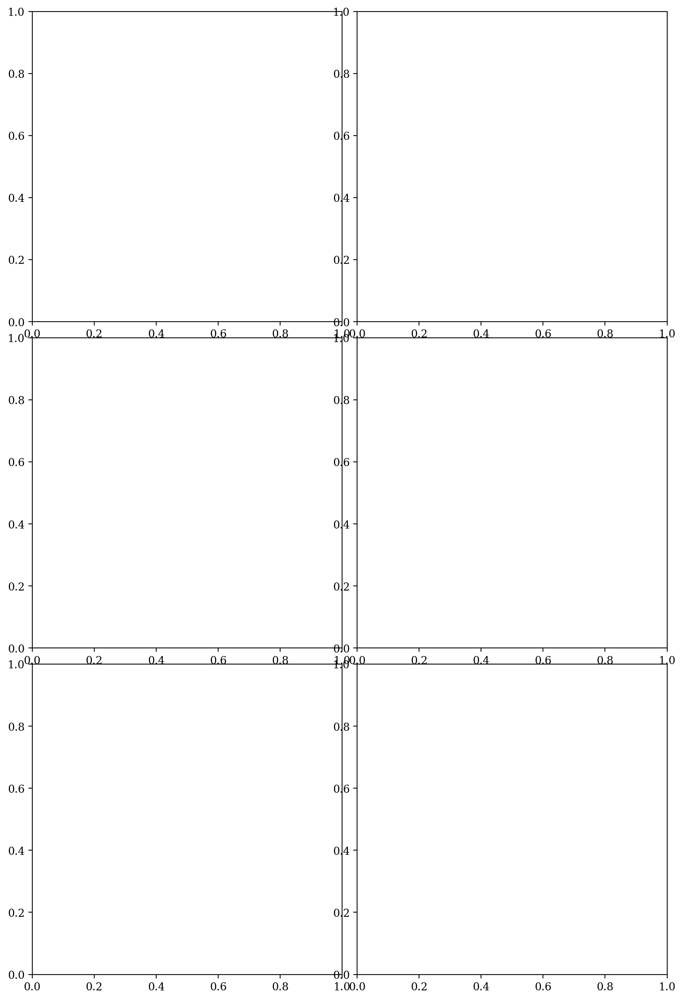

In [98]:
nrows = 3
ncols = 2
xborder = 1
yborder = 1
panel_bt = 0.25
panel_length = 4


# border input can be either a list or single number
if isinstance(xborder, float) or isinstance(xborder, int):
    xborder = [xborder, xborder]
if isinstance(yborder, float) or isinstance(yborder, int):
    yborder = [yborder, yborder]
if isinstance(panel_bt, float) or isinstance(panel_bt, int):
    panel_bt = [panel_bt, panel_bt]
# creating Figure object

figwidth = panel_length * ncols + panel_bt[0] * (ncols - 1) + \
        xborder[0] + xborder[1]
figheight = panel_length * nrows + panel_bt[1] * (nrows - 1) + \
        yborder[0] + yborder[1]

fig = plt.figure(figsize=(figwidth, figheight), dpi = 200)

# creating gridspec
gs = gspec.GridSpec(nrows, ncols)
plt.subplots_adjust(left= xborder[0]/figwidth, right=1-xborder[1]/figwidth,
        top=1-yborder[1]/figheight, bottom=yborder[0]/figheight,
        wspace=panel_bt[0]*ncols/figwidth, hspace=panel_bt[1]*nrows/figheight)

# making panels list
panels = []
for i in range(nrows):
    col_panels = []
    for j in range(ncols):
        col_panels.append(fig.add_subplot(gs[i, j]))

    panels.append(col_panels)

In [99]:
def avgmatrix(mat):
    mat = 10**mat
    mat = (mat[::2,:] + mat[1::2,:])
    mat = (mat[:, ::2] + mat[:, 1::2])
    return np.log10(mat)
def clear_axes():
    for i in range(nrows):
        for j in range(ncols):
            panels[i][j].clear()

    return

[-1.75012253  6.24987747]
2.1449814 10.692002
6.9418797 -1.6051412
-inf 10.412695
6.6625724 -inf
1.9369462 9.337216
5.587094 -1.8131764
-inf 9.1695595
5.419437 -inf


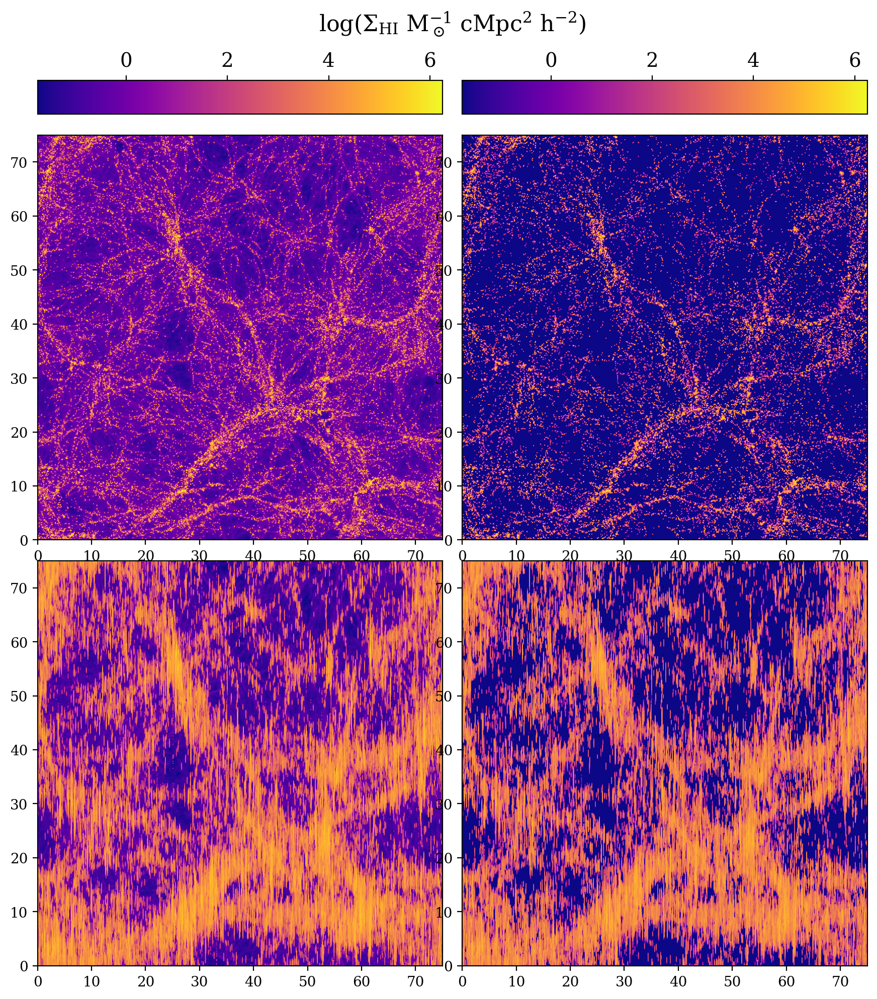

In [100]:
clear_axes()
vlim = np.array([10**2, 10**10], dtype = np.float64)
factor = 1/75**2
vlim *= factor
vlim = np.log10(vlim)
print(vlim)
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])
cmap_name = 'plasma'
under = 'k'
cmap = copy.copy(mpl.cm.get_cmap(cmap_name))
cmap.set_under(under)
sm = mpl.cm.ScalarMappable(norm = norm, cmap = cmap)
slices = [vnreal, hpreal, vnred, hpred]
idxs = [(1, 0), (1, 1), (2, 0), (2, 1)]
for i in range(len(idxs)):
    rc = slices[i]
    idx = idxs[i]
    xlim, ylim, data = rc.getValues()
    print(np.min(data), np.max(data))
    data += np.log10(factor)
    print(np.max(data), np.min(data))
    extent=(xlim[0], xlim[1], ylim[0], ylim[1])
            # x_bound, y_bound, mass = pslice.getValues()
            # extent=(x_bound[0], x_bound[1], y_bound[0], y_bound[1])
    mask = data < norm.vmin
    data[mask] = norm.vmin

    panels[idx[0]][idx[1]].imshow(data, cmap = cmap, norm = norm, aspect = 'auto', extent=extent, 
            origin='lower')
fig.colorbar(cax = panels[0][0],mappable = sm, orientation = 'horizontal')
fig.colorbar(cax = panels[0][1], mappable = sm, orientation = 'horizontal')

for p in [panels[0][0], panels[0][1]]:
    p.set_aspect(1/12, anchor = 'S')
    p.tick_params(which = 'both', labelsize = 14, labelbottom = False, labeltop = True,
                 bottom = False, top = True)

fig.text(0.5, 0.725, "log($\\Sigma_{\\mathrm{HI}}$ M$_\\odot^{-1}$ cMpc$^{2}$ h$^{-2}$)",
         ha = 'center', va = 'top', fontsize = 16)
fig

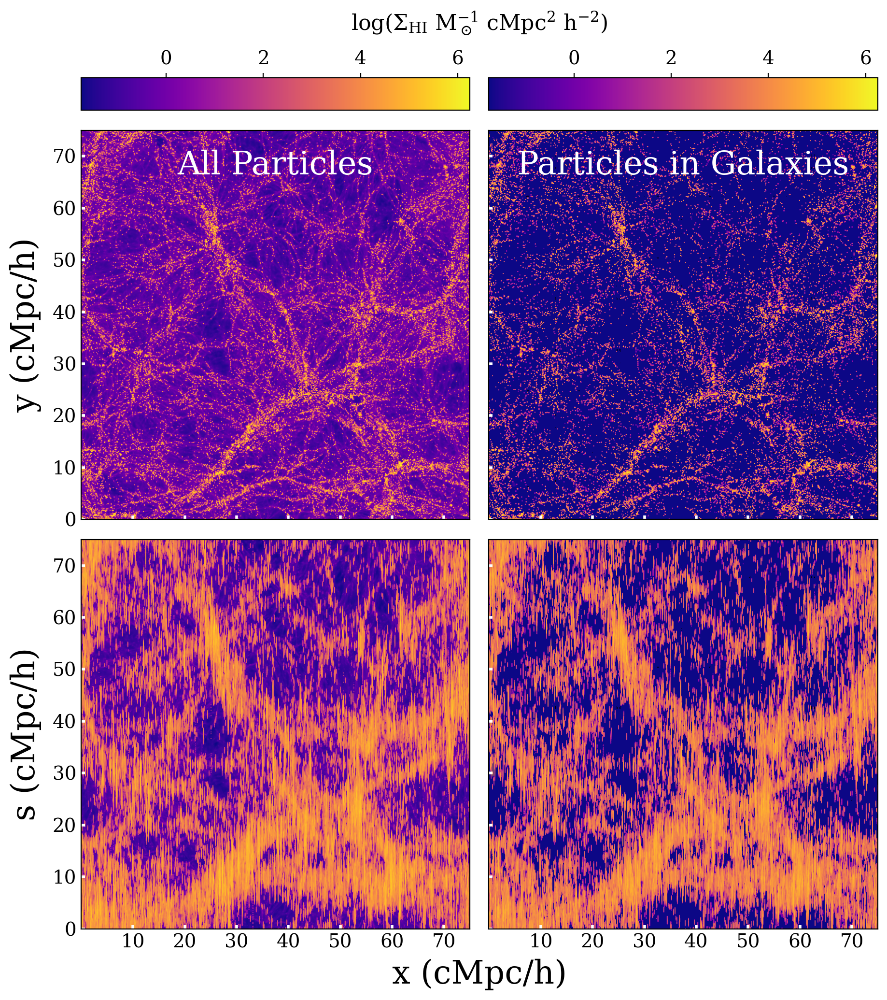

In [101]:
tkw = {'fontsize':24, 'color':'white', 'ha':'left', 'va':'bottom'}
locs = [10,20,30,40,50,60,70]
clabels = ['All Particles', 'Particles in Galaxies', 'Galaxy Centres']
tkw['ha'] = 'center'
tkw['va'] = 'top'

p = panels[0][0]

lpad = 8
for i in range(nrows - 1):
    for j in range(ncols):
        p = panels[i + 1][j]
        p.tick_params(direction = 'in', color = 'white', labelsize = 14, length = 3, width = 2)
        p.set_xticks(locs)
        p.set_yticks([0] + locs)
        if i == 0:
            p.text(0.5, 0.95, clabels[j], transform = p.transAxes, **tkw)
            p.tick_params(labelbottom = False)
            if j == 0:
                p.set_ylabel('y (cMpc/h)', fontsize = tkw['fontsize'], labelpad = lpad)
        if i == 1:
            if j == 0:
                p.set_ylabel('s (cMpc/h)', fontsize = tkw['fontsize'], labelpad =lpad) 
        if not j == 0:
            p.tick_params(labelleft = False)
fig.text(0.5, 0.025, 'x (cMpc/h)', ha = 'center', va = 'bottom', fontsize = tkw['fontsize'])
fig

In [103]:
fig.savefig("lowres_HI_slices_no_centers.pdf", dpi = 50, bbox_inches = 'tight')
fig.savefig("hires_HI_slices_no_centers.pdf", dpi = 300, bbox_inches = 'tight')